**Brian Blaylock**  
*September 26, 2019*

# GOES ABI RGB Recipes

I have gathered several RGB recipies from the [RAMMB CIRA](http://rammb.cira.colostate.edu/training/visit/quick_guides/) website, including:

- TrueColor
- FireTemperature
- AirMass
- DayCloudPhase
- DayConvection
- DayLandCloudFire
- WaterVapor
- DaySnowFog
- etc.

These recipies are provided by the `rgb` custom accessor. This accessor is avaialble when you import goes2go.

For more details on how to generate these plots, see the example on the [Unidata gallery](http://unidata.github.io/python-gallery/examples/mapping_GOES16_TrueColor.html#sphx-glr-examples-mapping-goes16-truecolor-py).

## Simple RGB Figure
At the most simple level, here is how to produce an RGB from the GOES ABI data.

In [2]:
from goes2go import GOES
import matplotlib.pyplot as plt

/p/home/blaylock/miniconda3/envs/goes2go/lib/python3.11/site-packages/goes2go/data.py:155: FutureWarning: In a future version of pandas all arguments of StringMethods.rsplit except for the argument 'pat' will be keyword-only.
  product_mode = df.product_mode.str.rsplit("-", 1, expand=True)


📦 Finished downloading [1] files to [/p/cwfs/blaylock/data/noaa-goes16/ABI-L2-MCMIPC].
📚 Finished reading [1] files into xarray.Dataset.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                

/p/home/blaylock/miniconda3/envs/goes2go/lib/python3.11/site-packages/matplotlib/cm.py:496: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


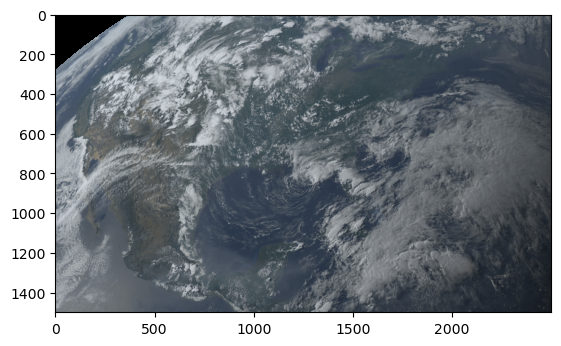

In [3]:
# Get an ABI Dataset
G = GOES().latest()

# Create RGB and plot
plt.imshow(G.rgb.TrueColor())

## Cartopy RGB Figure
The RGB can easily be added to a Cartopy axis

/p/home/blaylock/miniconda3/envs/goes2go/lib/python3.11/site-packages/matplotlib/cm.py:496: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


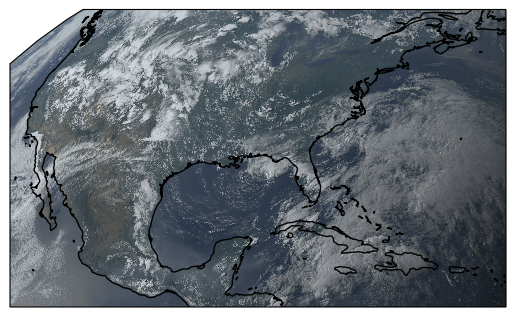

In [4]:
ax = plt.subplot(projection=G.rgb.crs)
ax.imshow(G.rgb.TrueColor(), **G.rgb.imshow_kwargs)
ax.coastlines()

## All available RGB recipes

In [5]:
from goes2go import GOES
import matplotlib.pyplot as plt

# Function from Carpenter_Workshop: https://github.com/blaylockbk/Carpenter_Workshop
from toolbox import EasyMap, pc, ccrs

In [6]:
# G16 = goes_latest()
# G17 = goes_latest(satellite=17)

G16 = GOES(satellite=16).nearesttime("2020-9-22 18")
G17 = GOES(satellite=17).nearesttime("2020-9-22 18")

/p/home/blaylock/miniconda3/envs/goes2go/lib/python3.11/site-packages/goes2go/data.py:155: FutureWarning: In a future version of pandas all arguments of StringMethods.rsplit except for the argument 'pat' will be keyword-only.
  product_mode = df.product_mode.str.rsplit("-", 1, expand=True)


 👮🏻‍♂️ File already exists. Do not overwrite: /p/cwfs/blaylock/data/noaa-goes16/ABI-L2-MCMIPC/2020/266/18/OR_ABI-L2-MCMIPC-M6_G16_s20202661801132_e20202661803505_c20202661804060.nc
📦 Finished downloading [1] files to [/p/cwfs/blaylock/data/noaa-goes16/ABI-L2-MCMIPC].
📚 Finished reading [1] files into xarray.Dataset.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           

/p/home/blaylock/miniconda3/envs/goes2go/lib/python3.11/site-packages/goes2go/data.py:155: FutureWarning: In a future version of pandas all arguments of StringMethods.rsplit except for the argument 'pat' will be keyword-only.
  product_mode = df.product_mode.str.rsplit("-", 1, expand=True)


 👮🏻‍♂️ File already exists. Do not overwrite: /p/cwfs/blaylock/data/noaa-goes17/ABI-L2-MCMIPC/2020/266/18/OR_ABI-L2-MCMIPC-M6_G17_s20202661801176_e20202661803561_c20202661804089.nc
📦 Finished downloading [1] files to [/p/cwfs/blaylock/data/noaa-goes17/ABI-L2-MCMIPC].
📚 Finished reading [1] files into xarray.Dataset.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           

In [7]:
rgb_products = [i for i in dir(G16.rgb) if i[0].isupper()]
rgb_products

['AirMass',
 'Ash',
 'DayCloudConvection',
 'DayCloudPhase',
 'DayConvection',
 'DayLandCloud',
 'DayLandCloudFire',
 'DaySnowFog',
 'DifferentialWaterVapor',
 'Dust',
 'FireTemperature',
 'NaturalColor',
 'NightFogDifference',
 'NighttimeMicrophysics',
 'NormalizedBurnRatio',
 'RocketPlume',
 'SplitWindowDifference',
 'SulfurDioxide',
 'TrueColor',
 'WaterVapor']

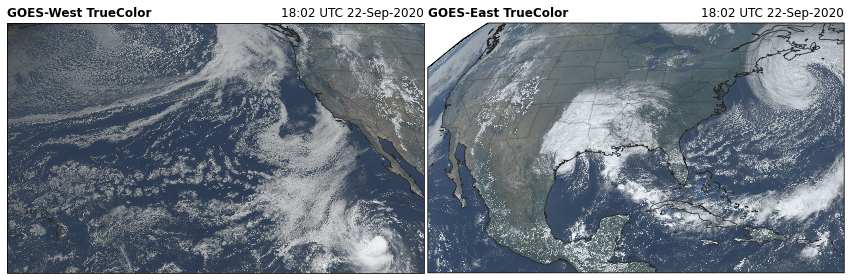

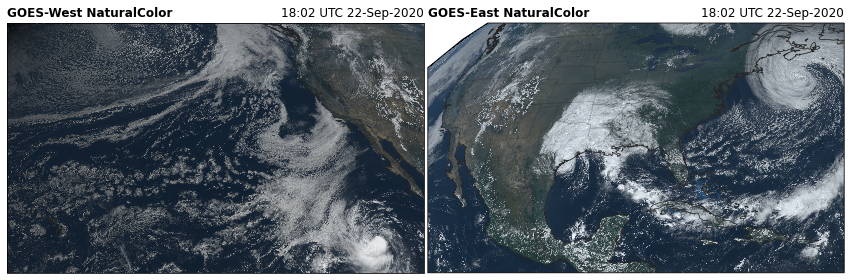

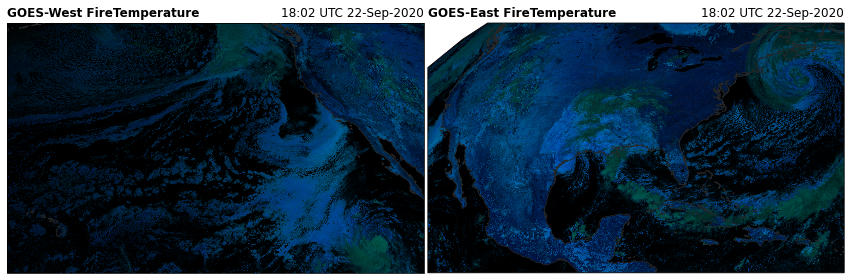

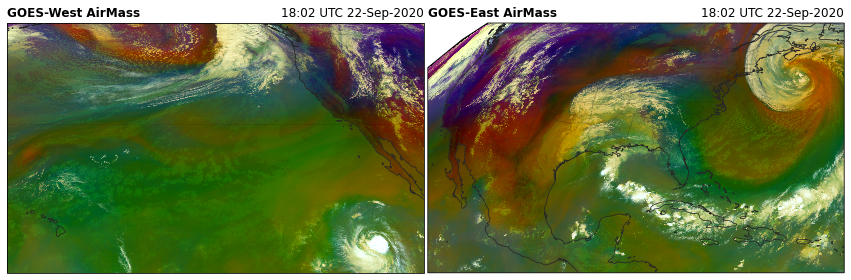

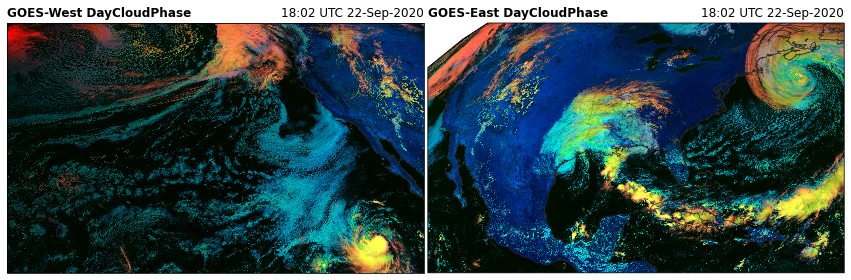

...

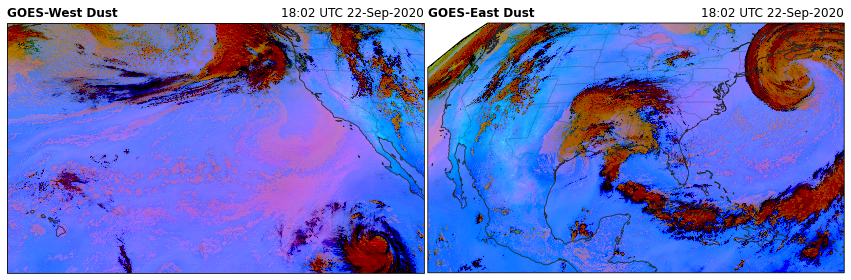

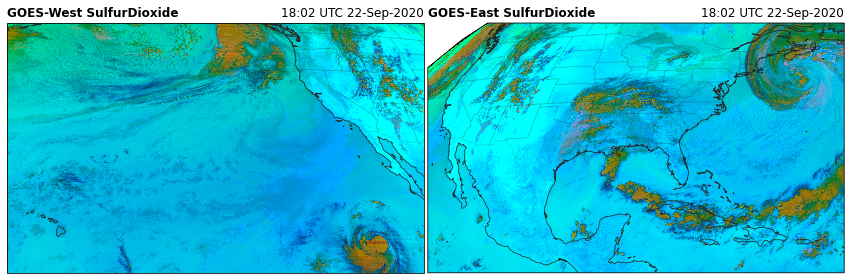

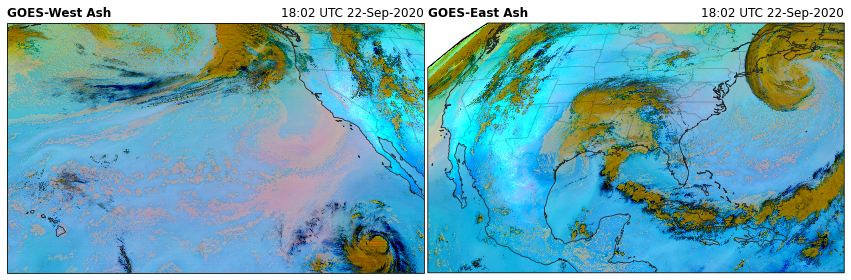

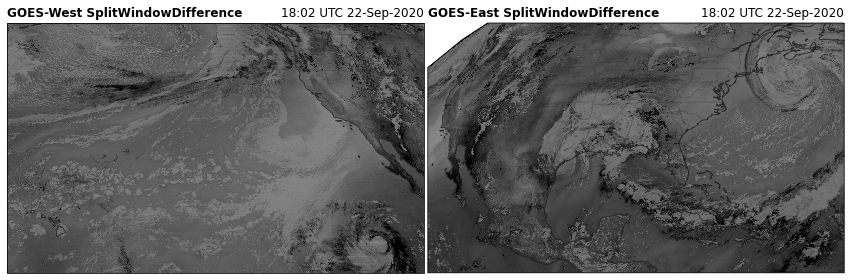

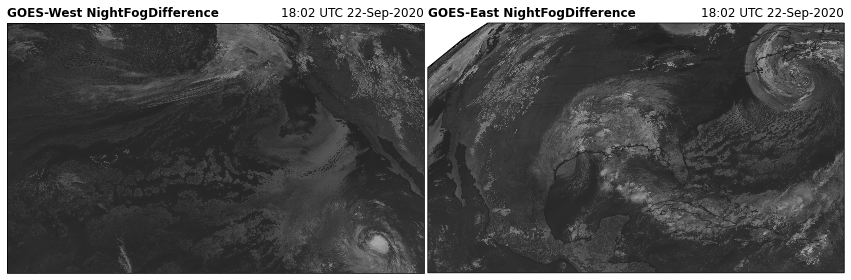

In [4]:
rgb_products = [i for i in dir(G16.rgb) if i[0].isupper()]

for product in rgb_products:

    fig = plt.figure(figsize=(15, 12))
    ax17 = fig.add_subplot(1, 2, 1, projection=G17.rgb.crs)
    ax16 = fig.add_subplot(1, 2, 2, projection=G16.rgb.crs)

    for ax, G in zip([ax17, ax16], [G17, G16]):
        RGB = getattr(G.rgb, product)()

        EasyMap("50m", STATES=True, ax=ax)
        ax.imshow(RGB, **G.rgb.imshow_kwargs)
        ax.set_title(f"{G.orbital_slot} {product}", loc="left", fontweight="bold")
        ax.set_title(f"{G.t.dt.strftime('%H:%M UTC %d-%b-%Y').item()}", loc="right")
    plt.subplots_adjust(wspace=0.01)
    plt.savefig(f"../docs/_static/{product}", bbox_inches="tight")

## Full Disk

In [5]:
g = goes_nearesttime("2021-01-01 18:00", satellite=16, product="ABI", domain="F")

 _______________________________
 | Satellite: noaa-goes16      |
 |   Product: ABI-L2-MCMIPF    |
 |    Domain: F                |
📦 Finished downloading [1] files to [/p/cwfs/blaylock/data/noaa-goes16/ABI-L2-MCMIPF].                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

In [3]:
# Original TrueColor
tc = TrueColor(g, night_IR=False)

# Rick Kohrs's Natural Color
nc = NaturalColor(g, night_IR=False)

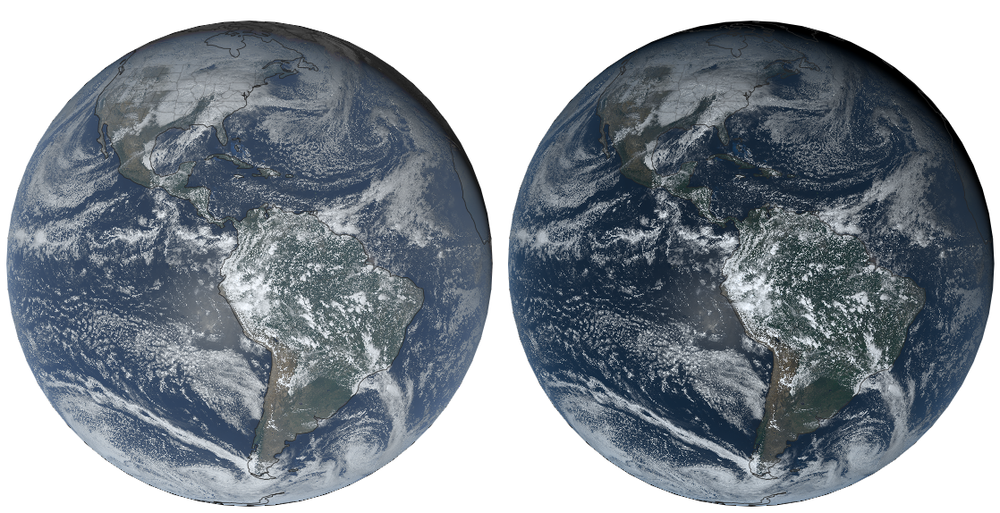

In [8]:
#%config InlineBackend.print_figure_kwargs = {'facecolor' : 'k'}
%config InlineBackend.print_figure_kwargs = {'facecolor' : 'none'}
#%config InlineBackend.print_figure_kwargs = {'facecolor' : 'w'}

fig, (ax1, ax2) = plt.subplots(
    1, 2, figsize=[20, 10], subplot_kw=dict(projection=g.rgb.crs)
)

for ax in [ax1, ax2]:
    common_features(ax=ax, STATES=True)


ax1.imshow(g.rgb.TrueColor(), **g.rgb.imshow_kwargs)
ax1.set_title("True Color", color="w")
ax1.axis("off")

ax2.imshow(g.rgb.NaturalColor(), **g.rgb.imshow_kwargs)
ax2.set_title("Natural Color", color="w")
ax2.axis("off")

plt.subplots_adjust(wspace=0.01)
fig.set_facecolor("k")

plt.savefig("../docs/_static/True-vs-Natural_color", bbox_inches="tight")

In [ ]:
#%config InlineBackend.print_figure_kwargs = {'facecolor' : 'k'}
#%config InlineBackend.print_figure_kwargs = {'facecolor' : 'none'}
%config InlineBackend.print_figure_kwargs = {'facecolor' : 'w'}

## RGB Sample

In [3]:
# Obtain a GOES ABI multichannel image
g = goes_nearesttime("2020-12-13 18:00", satellite=16, product="ABI", domain="F")

 _______________________________
 | Satellite: noaa-goes16      |
 |   Product: ABI-L2-MCMIPF    |
 |    Domain: F                |
📦 Finished downloading [1] files to [/p/home/blaylock/data/noaa-goes16/ABI-L2-MCMIPF].                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

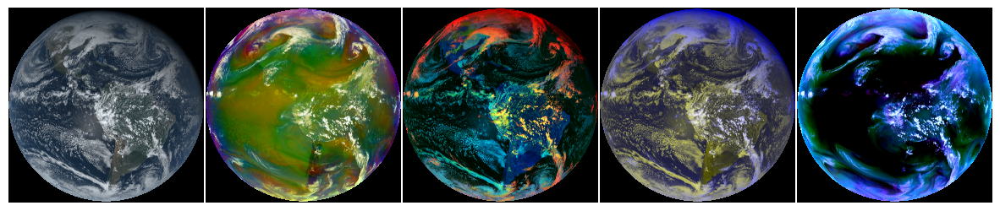

In [11]:
products = [
    "NaturalColor",
    "AirMass",
    "DayCloudPhase",
    "DayCloudConvection",
    "WaterVapor",
]

fig, axes = plt.subplots(1, len(products), figsize=[15, 3.5], dpi=100)
for product, ax in zip(products, axes):
    nc = getattr(g.rgb, product)()
    ax.imshow(nc)
    ax.axis("off")
plt.subplots_adjust(wspace=0.01)

plt.savefig(f"../docs/_static/RGB_sample", bbox_inches="tight", facecolor="k")

# 🚀 Rocket Plume
A new RGB recipie from [CIMSS](https://cimss.ssec.wisc.edu/satellite-blog/archives/41335)

Obtain the Mesoscale scan to identify rocket plume, because the time resolution is every 30 seconds when both mesoscale scans are in the same location

In [12]:
import matplotlib.pyplot as plt
import pandas as pd

from goes2go.data import goes_nearesttime

from toolbox.cartopy_tools import common_features

In [13]:
# Rocket plume at 00:29 UTC 16 November 2020 for SpaceX crewed mission
g = goes_nearesttime(
    "2020-11-16 00:29:50", product="ABI", satellite="goes16", domain="M"
)

 _______________________________
 | Satellite: noaa-goes16      |
 |   Product: ABI-L2-MCMIPM    |
 |    Domain: M                |
📦 Finished downloading [1] files to [/p/cwfs/blaylock/data/noaa-goes16/ABI-L2-MCMIPM].                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

/p/home/blaylock/anaconda3/envs/goes2go/lib/python3.8/site-packages/cartopy/mpl/style.py:90: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


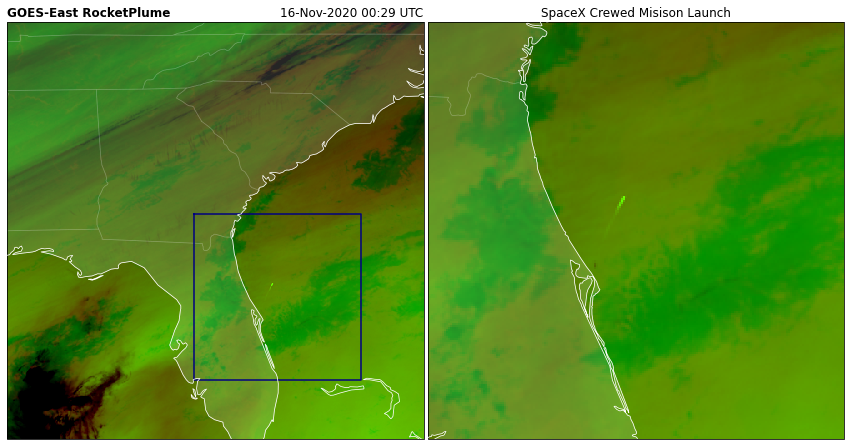

In [14]:
fig = plt.figure(figsize=(15, 12))

str_date_16 = f"{pd.to_datetime(g.time_coverage_start.item()):%d-%b-%Y %H:%M UTC}"

# Create axis with Geostationary projection
ax16_wide = fig.add_subplot(1, 2, 1, projection=g.rgb.crs)
ax16_zoom = fig.add_subplot(1, 2, 2, projection=g.rgb.crs)

# Add common features to map (coastlines and state borders)
common_features("50m", ax=ax16_wide, STATES=True, color="white")
common_features("10m", ax=ax16_zoom, STATES=True, color="white")

# GOES-East
ax16_wide.set_title(f"GOES-East RocketPlume", loc="left", fontweight="bold")
ax16_wide.set_title(f"{str_date_16}", loc="right")
ax16_wide.imshow(g.rgb.RocketPlume(), **g.rgb.imshow_kwargs)

ax16_zoom.set_title(f"SpaceX Crewed Misison Launch", loc="center")
ax16_zoom.imshow(g.rgb.RocketPlume(), **g.rgb.imshow_kwargs)
ax16_zoom.center_extent(-80.2, 29.1, pad=20_0000)


left, right, bottom, top = ax16_zoom.get_extent()

lons = [left, right, right, left, left]
lats = [top, top, bottom, bottom, top]

ax16_wide.plot(lons, lats, color="navy")


plt.subplots_adjust(wspace=0.01)
# plt.savefig(f'../images/{func.__name__}', bbox_inches='tight')
plt.savefig(f"../docs/_static/RocketPlume", bbox_inches="tight")